## Learn from Kaggle's tutorial on Linear Regression with Time Series with Store Sales data

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [3]:
df = pd.read_csv(
    "store-sales-time-series-forecasting/train.csv",
    index_col='date',
    parse_dates=['date'],
)

df.head()

,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0
2013-01-01,1,1,BABY CARE,0.0,0
2013-01-01,2,1,BEAUTY,0.0,0
2013-01-01,3,1,BEVERAGES,0.0,0
2013-01-01,4,1,BOOKS,0.0,0


In [58]:
df.columns

Index(['id', 'store_nbr', 'family', 'sales', 'onpromotion', 'Time'], dtype='object')

In [59]:
df.index

DatetimeIndex(['2013-01-01', '2013-01-01', '2013-01-01', '2013-01-01',
               '2013-01-01', '2013-01-01', '2013-01-01', '2013-01-01',
               '2013-01-01', '2013-01-01',
               ...
               '2017-08-15', '2017-08-15', '2017-08-15', '2017-08-15',
               '2017-08-15', '2017-08-15', '2017-08-15', '2017-08-15',
               '2017-08-15', '2017-08-15'],
              dtype='datetime64[ns]', name='date', length=3000888, freq=None)

In [60]:
len(set(df.index)) # so in total there are 1684 days, aka more than 4 years

1684

### Time-step features¶

There are two kinds of features unique to time series: 
* time-step features 
* lag features.

**Time-step features** are features we can derive directly from the time index. 

The most basic time-step feature is the **time dummy**, which counts off time steps in the series from beginning to end.

In [7]:
df['Time'] = np.arange(len(df.index))

df.head()

,id,store_nbr,family,sales,onpromotion,Time
date,,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0,0
2013-01-01,1,1,BABY CARE,0.0,0,1
2013-01-01,2,1,BEAUTY,0.0,0,2
2013-01-01,3,1,BEVERAGES,0.0,0,3
2013-01-01,4,1,BOOKS,0.0,0,4


Linear regression with the time dummy produces the model:

target = weight * time + bias

The time dummy then lets us fit curves to time series in a time plot, where **time** forms the x-axis.

In [62]:
dfPivot =df.pivot_table(index='date', values=['sales'], aggfunc='sum')
dfPivot

,sales
date,
2013-01-01,2511.618999
2013-01-02,496092.417944
2013-01-03,361461.231124
2013-01-04,354459.677093
2013-01-05,477350.121229
...,...
2017-08-11,826373.722022
2017-08-12,792630.535079
2017-08-13,865639.677471


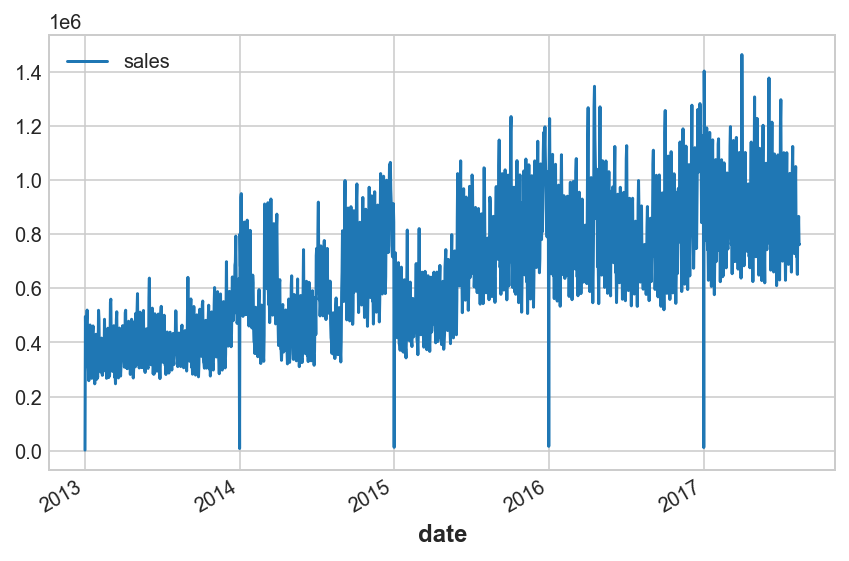

In [63]:
dfPivot.plot();

**Note**:
Time-step features let us model time dependence. 

A series is time dependent if its values can be predicted from the time they occured. 

In the series above, we can predict that sales later in the month are generally higher than sales earlier in the month, 
but let us add the **time** column first.

In [65]:
dfPivot['Time'] = np.arange(len(dfPivot.index))

dfPivot.head()

,sales,Time
date,,
2013-01-01,2511.618999,0
2013-01-02,496092.417944,1
2013-01-03,361461.231124,2
2013-01-04,354459.677093,3
2013-01-05,477350.121229,4


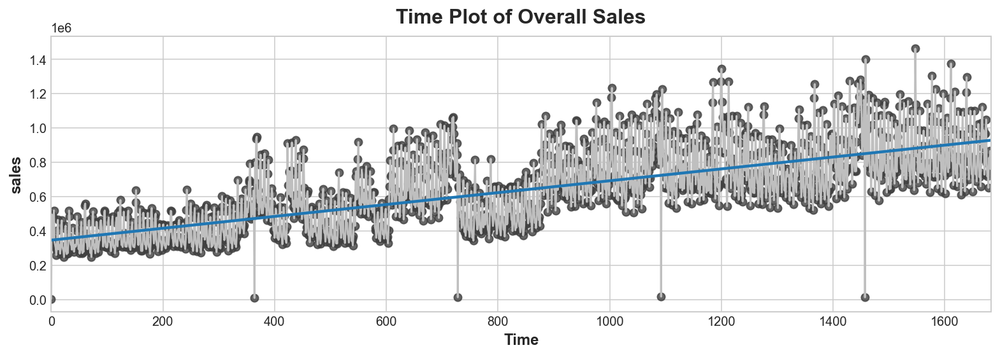

In [67]:
plt.style.use("seaborn-whitegrid")
plt.rc(
    "figure",
    autolayout=True,
    figsize=(11, 4),
    titlesize=18,
    titleweight='bold',
)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=16,
    titlepad=10,
)
%config InlineBackend.figure_format = 'retina'

fig, ax = plt.subplots()
ax.plot('Time', 'sales', data=dfPivot, color='0.75')
ax = sns.regplot(x='Time', y='sales', data=dfPivot, ci=None, scatter_kws=dict(color='0.25'))
ax.set_title('Time Plot of Overall Sales');

**Note:**

a little try from myself to plot based on product types (spoil alert: this part is kinda long...)
* groupby
* pivot_table

In [19]:
# given that 'family' identifies the type of product sold, let's try to see how many automotive poducts have been sold
# use groupby
salesByProduct = df.groupby(['family', 'date'], sort = True)[['sales']].sum()

In [20]:
salesByProduct.head()

sales
family     date             
AUTOMOTIVE 2013-01-01    0.0
           2013-01-02  255.0
           2013-01-03  161.0
           2013-01-04  169.0
           2013-01-05  342.0

In [31]:
# since salesByProduct is a MultiIndex object, I found an useful post on discussing this
# the link is: https://stackoverflow.com/questions/53927460/select-rows-in-pandas-multiindex-dataframe
salesByProduct.loc[['AUTOMOTIVE']]

sales
family     date             
AUTOMOTIVE 2013-01-01    0.0
           2013-01-02  255.0
           2013-01-03  161.0
           2013-01-04  169.0
           2013-01-05  342.0
...                      ...
           2017-08-11  441.0
           2017-08-12  403.0
           2017-08-13  481.0
           2017-08-14  292.0
           2017-08-15  337.0

[1684 rows x 1 columns]

In [32]:
salesAutomotive = salesByProduct.loc[['AUTOMOTIVE']]

In [39]:
salesAutomotive.loc['AUTOMOTIVE']

,sales
date,
2013-01-01,0.0
2013-01-02,255.0
2013-01-03,161.0
2013-01-04,169.0
2013-01-05,342.0
...,...
2017-08-11,441.0
2017-08-12,403.0
2017-08-13,481.0


In [41]:
salesAuto = salesAutomotive.loc['AUTOMOTIVE']
type(salesAuto)

pandas.core.frame.DataFrame

<AxesSubplot:xlabel='date'>

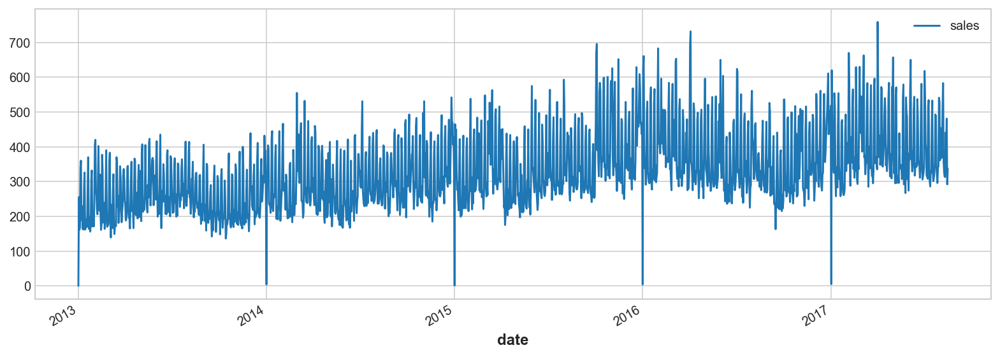

In [85]:
salesAuto.plot()

<ipython-input-86-b0f2f646d9c4>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()
C:\Users\zxy23\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


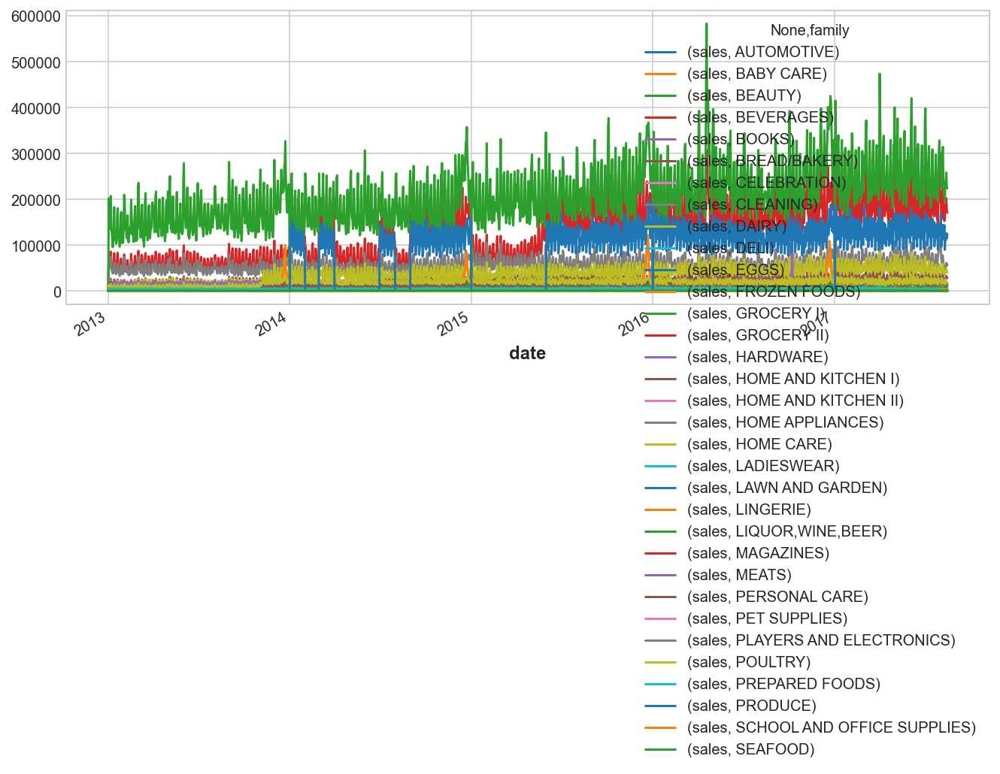

In [86]:
# draw plots with all product types
ax = salesByProduct.unstack(level=0).plot()
plt.tight_layout()

now try using pivot_table

In [69]:
salesPivot = df.pivot_table(index='family', columns='date', values=['sales'], aggfunc='sum')

salesPivot.plot()
plt.tight_layout()
# I'll just keep it here as a reference of pivot table

<ipython-input-69-9951b912ff74>:4: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()
C:\Users\zxy23\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


<ipython-input-71-423720e5fc2b>:4: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout();
C:\Users\zxy23\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


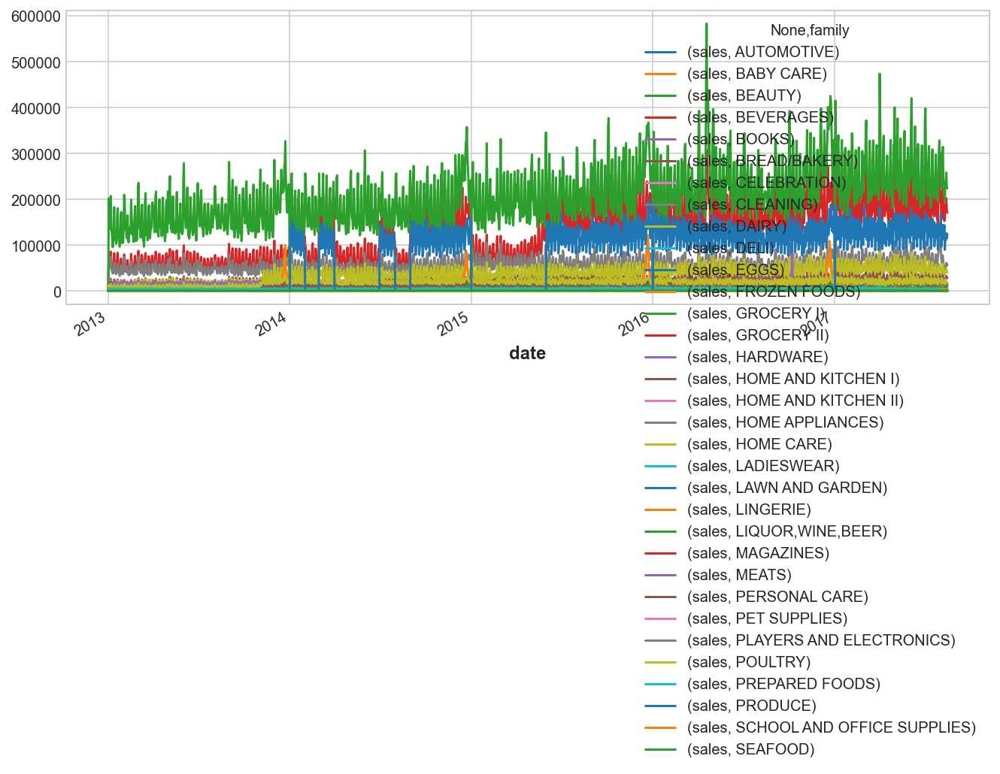

In [71]:
salesPivotProduct = df.pivot_table(index='date', columns='family', values=['sales'], aggfunc='sum')

salesPivotProduct.plot()
plt.tight_layout();

In [72]:
salesPivotProduct.head()

sales                                                \
family     AUTOMOTIVE BABY CARE BEAUTY BEVERAGES BOOKS BREAD/BAKERY   
date                                                                  
2013-01-01        0.0       0.0    2.0     810.0   0.0    180.58900   
2013-01-02      255.0       0.0  207.0   72092.0   0.0  26246.31900   
2013-01-03      161.0       0.0  125.0   52105.0   0.0  18456.48002   
2013-01-04      169.0       0.0  133.0   54167.0   0.0  16721.96901   
2013-01-05      342.0       0.0  191.0   77818.0   0.0  22367.76108   

                                                       ...            \
family     CELEBRATION CLEANING    DAIRY         DELI  ... MAGAZINES   
date                                                   ...             
2013-01-01         0.0    186.0    143.0     71.09000  ...       0.0   
2013-01-02         0.0  74629.0  23381.0  15754.50000  ...       0.0   
2013-01-03         0.0  55893.0  18001.0  11172.45500  ...       0.0   
2013-01-04         0.0  52064.0  18148.0  10143.20900  ...       0.0   
2013-01-05         0.0  70128.0  23082.0  13734.94501  ...       0.0   

                                                                             \
family             MEATS PERSONAL CARE PET SUPPLIES PLAYERS AND ELECTRONICS   
date                                                                          
2013-01-01    110.801000          25.0          0.0                     0.0   
2013-01-02  20871.464028       17204.0          0.0                     0.0   
2013-01-03  16597.398113       12568.0          0.0                     0.0   
2013-01-04  21625.963055       11303.0          0.0                     0.0   
2013-01-05  20879.091050       16819.0          0.0                     0.0   

                                                                            \
family           POULTRY PREPARED FOODS PRODUCE SCHOOL AND OFFICE SUPPLIES   
date                                                                         
2013-01-01     42.637000      37.847000     0.0                        0.0   
2013-01-02  13975.884938    5338.111976     0.0                        0.0   
2013-01-03  10674.393983    3591.388005     0.0                        0.0   
2013-01-04  10772.515038    4472.965990     0.0                        0.0   
2013-01-05  13475.009055    5830.073020     0.0                        0.0   

                         
family          SEAFOOD  
date                     
2013-01-01     0.000000  
2013-01-02  1526.750002  
2013-01-03  1094.310994  
2013-01-04  1293.120995  
2013-01-05  1245.637004  

[5 rows x 33 columns]

In [80]:
salesPivotProduct.columns[:3]

MultiIndex([('sales', 'AUTOMOTIVE'),
            ('sales',  'BABY CARE'),
            ('sales',     'BEAUTY')],
           names=[None, 'family'])

In [82]:
salesPivotProduct[('sales',   'AUTOMOTIVE')]

date
2013-01-01      0.0
2013-01-02    255.0
2013-01-03    161.0
2013-01-04    169.0
2013-01-05    342.0
              ...  
2017-08-11    441.0
2017-08-12    403.0
2017-08-13    481.0
2017-08-14    292.0
2017-08-15    337.0
Name: (sales, AUTOMOTIVE), Length: 1684, dtype: float64

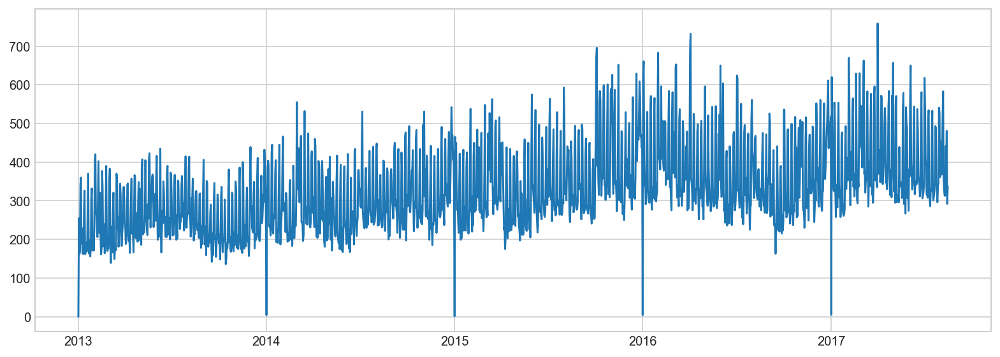

In [83]:
plt.plot(salesPivotProduct[('sales',  'AUTOMOTIVE')])

**Lag features**

To make a lag feature we shift the observations of the target series so that they appear to have occured later in time. Here we've created a 1-step lag feature, though shifting by multiple steps is possible too.

In [87]:
dfPivot['Lag_1'] = dfPivot['sales'].shift(1)
dfPivot = dfPivot.reindex(columns=['sales', 'Lag_1'])

dfPivot.head()

,sales,Lag_1
date,,
2013-01-01,2511.618999,NaN
2013-01-02,496092.417944,2511.618999
2013-01-03,361461.231124,496092.417944
2013-01-04,354459.677093,361461.231124
2013-01-05,477350.121229,354459.677093


Linear regression with a **lag feature** produces the model:

target = weight * lag + bias

So lag features let us fit curves to lag plots where each observation in a series is plotted against the previous observation.

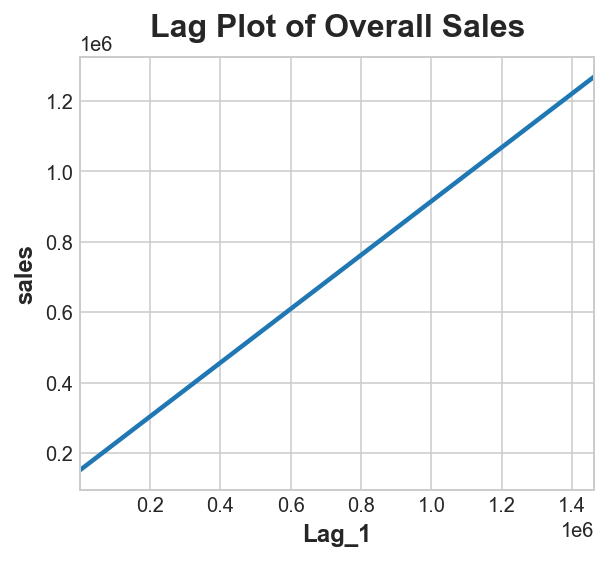

In [89]:
fig, ax = plt.subplots()
# ax = sns.regplot(x='Lag_1', y='sales', data=dfPivot, ci=None, scatter_kws=dict(color='0.25'))
ax = sns.regplot(x='Lag_1', y='sales', data=dfPivot, ci=None, scatter = False) # adding scatters is really ugly...
ax.set_aspect('equal')
ax.set_title('Lag Plot of Overall Sales');

We can see from the lag plot that sales on one day (sales) are correlated with sales from the previous day (Lag_1). When we see a relationship like this, we know a **lag feature** will be useful.

More generally, lag features let you model **serial dependence**. A time series has serial dependence when an observation can be predicted from previous observations. In this example, we can predict that high total sales on one day usually mean high total sales the next day.



Adapting machine learning algorithms to time series problems is largely about **feature engineering with the time index and lags**. 

For most of the course, we use **linear regression** for its simplicity, but these features will be useful whichever algorithm you choose for your forecasting task.